<a href="https://colab.research.google.com/github/ritwiks9635/Generative_AI_Model/blob/main/Image_Colorization_using_Gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**💫Image Colorization using Gans**

## **Import Necessary Libraries**

In [3]:
import os
import cv2
from glob import glob
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Input, Conv2D, BatchNormalization, UpSampling2D, Concatenate, MaxPooling2D
from tensorflow.keras.layers import Flatten, Dense, LeakyReLU, Dropout
from tensorflow.keras.models import Sequential
from keras.models import Model
from keras.regularizers import l2
from keras.utils import plot_model

import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings("ignore")

In [4]:
gray_img_folder = "/content/gray"
org_img_folder = "/content/resized"

In [5]:
baw_img = sorted([os.path.join(gray_img_folder, file) for file in os.listdir(gray_img_folder)])
org_img = sorted([os.path.join(org_img_folder, file) for file in os.listdir(org_img_folder)])

train_split = int(len(baw_img) * 0.9)

train_baw_img = baw_img[: train_split]
train_org_img = org_img[: train_split]

val_baw_img = baw_img[train_split :]
val_org_img = org_img[train_split :]

print(train_baw_img[1], "|", train_org_img[1])

/content/gray/Victorian10.png | /content/resized/Victorian10.png


(256, 256, 3)
(256, 256, 3)


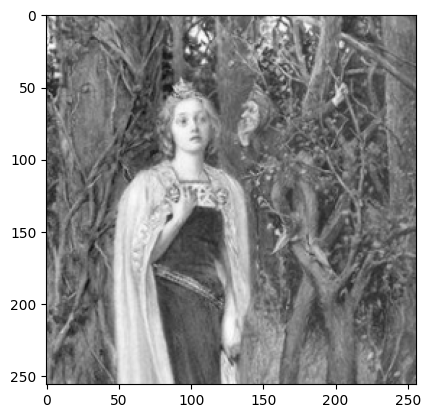

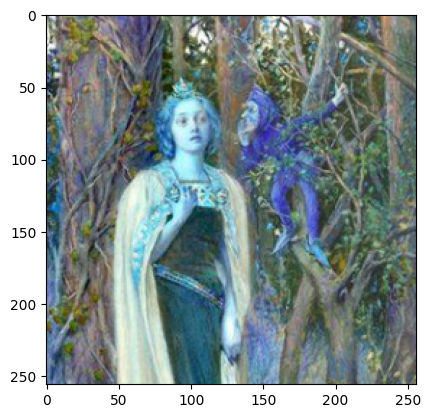

In [6]:
img_g = cv2.imread(baw_img[12])
img_o = cv2.imread(org_img[12])
print(img_g.shape)
print(img_o.shape)
plt.imshow(img_g)
plt.show()

plt.imshow(img_o)
plt.show()

## **Build Data Generator**

In [7]:
def data_generator(img_path, baw_img = True):
    img = tf.io.read_file(img_path)

    if baw_img:
        img = tf.io.decode_png(img, channels=1)
        img.set_shape([None, None, 1])
        img = tf.image.resize(img, size=[256, 256])
    else:
        img = tf.io.decode_png(img, channels=3)
        img.set_shape([None, None, 3])
        img = tf.image.resize(img, size=[256, 256])


    img = img / 255.0

    return img


def dataloader(baw_img, org_img):
    baw_img = data_generator(baw_img)
    org_img = data_generator(org_img, baw_img = False)
    return baw_img, org_img

def build_dataset(baw_img, org_img, batch_size=4, augment=True):
    dataset = tf.data.Dataset.from_tensor_slices((baw_img, org_img))
    dataset = dataset.map(dataloader, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=100)  # Shuffle for training
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Build train and validation datasets with augmentations for training
train_dataset = build_dataset(train_baw_img, train_org_img, augment=True)
val_dataset = build_dataset(val_baw_img, val_org_img, augment=False)

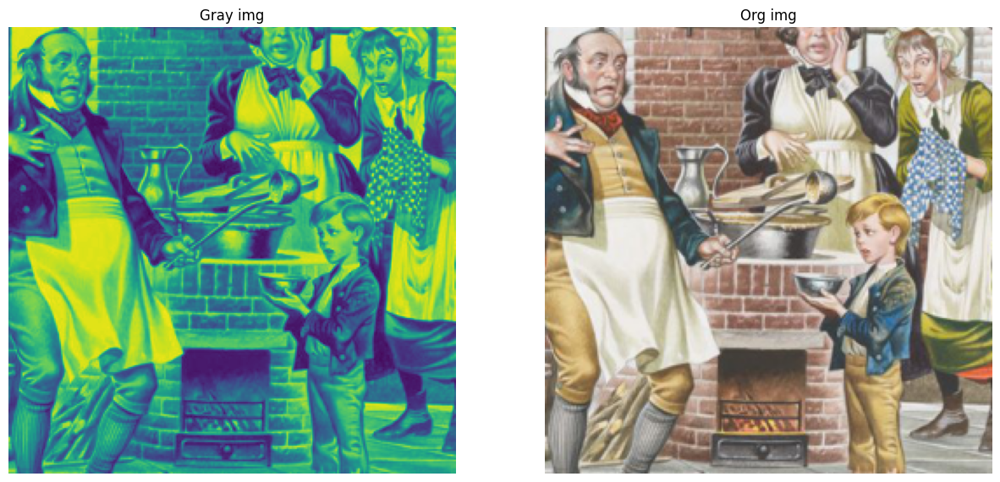

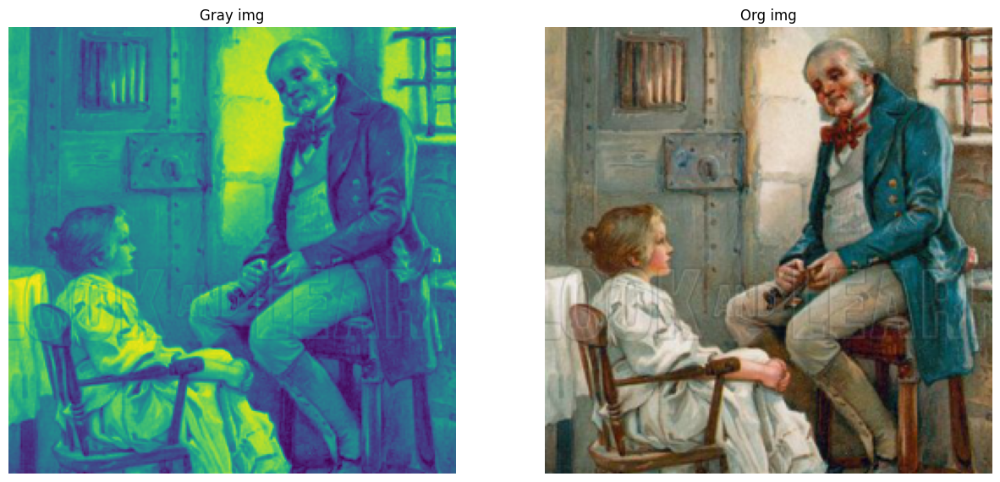

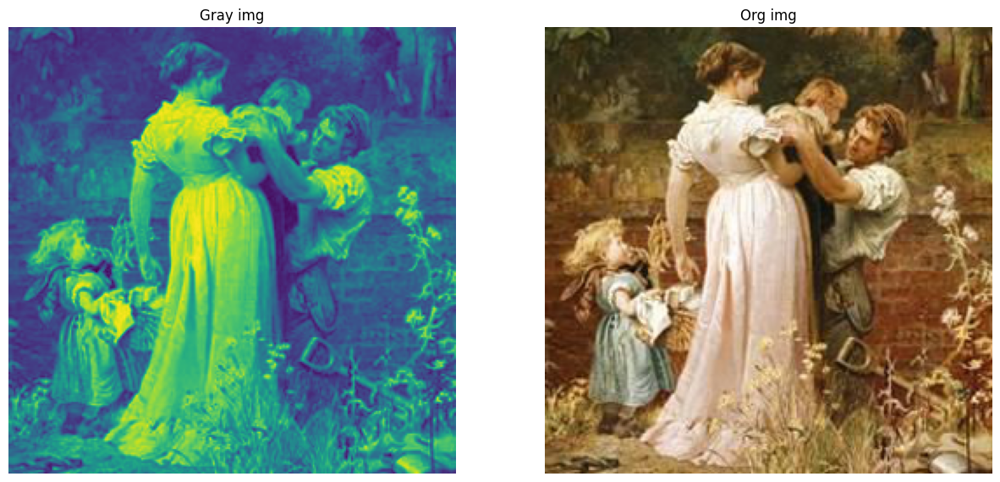

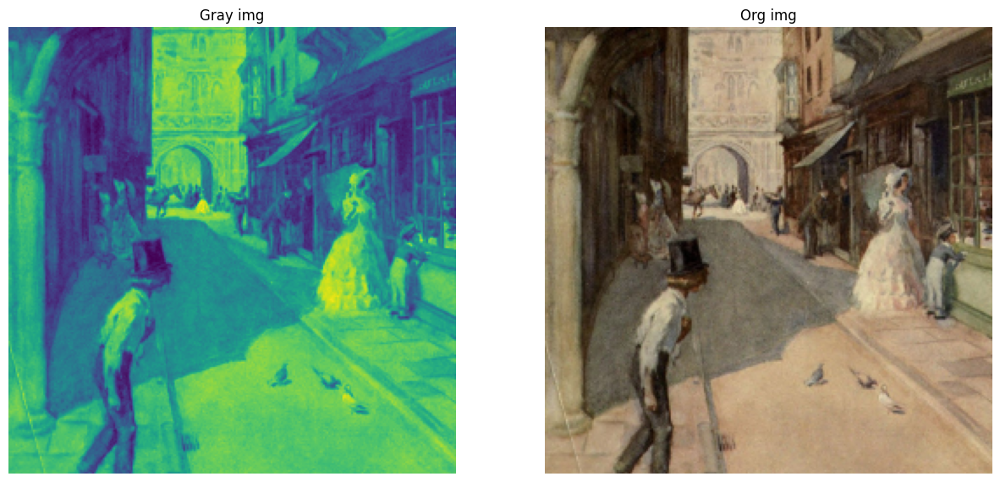

In [8]:
def display_input(Gray, Org):
    plt.figure(figsize=(15, 15))
    display = [Gray[0], Org[0]]
    title = ["Gray img", "Org img"]
    for i in range(2):
        plt.subplot(1, 2, i + 1)
        plt.imshow(display[i])
        plt.title(title[i])
        plt.axis("off")
    plt.show()


for Gray, Org in train_dataset.take(4):
    display_input(Gray, Org)

In [9]:
print(train_dataset)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>


## **Build Generator Model**

In [35]:
def build_generator():
    input_layer = layers.Input(shape=(256, 256, 1), name="input_layer")

    # Convert grayscale to 3-channel input
    x = layers.Conv2D(32, (3, 3), padding="same", activation="relu", name="conv1")(input_layer)
    x = layers.BatchNormalization(name="bn1")(x)
    x = layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same", activation="relu", name="conv2")(x)  # Downsample to (128, 128)
    x = layers.BatchNormalization(name="bn2")(x)

    x = layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same", activation="relu", name="conv3")(x)  # Downsample to (64, 64)
    x = layers.BatchNormalization(name="bn3")(x)

    # Bottleneck
    x = layers.Conv2D(256, (3, 3), padding="same", activation="relu", name="bottleneck")(x)
    x = layers.BatchNormalization(name="bn4")(x)

    # Upsample back to 256x256
    x = layers.UpSampling2D(size=(2, 2), name="upsample1")(x)  # Upsample to (128, 128)
    x = layers.Conv2D(128, (3, 3), padding="same", activation="relu", name="deconv1")(x)
    x = layers.BatchNormalization(name="bn5")(x)

    x = layers.UpSampling2D(size=(2, 2), name="upsample2")(x)  # Upsample to (256, 256)
    x = layers.Conv2D(64, (3, 3), padding="same", activation="relu", name="deconv2")(x)
    x = layers.BatchNormalization(name="bn6")(x)

    # Output layer
    predicted_rgb = layers.Conv2D(3, (3, 3), padding="same", activation="sigmoid", name="predicted_rgb")(x)

    model = Model(inputs=input_layer, outputs=predicted_rgb, name="Generator")
    return model

In [38]:
generator = build_generator()
generator.summary()

Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 256, 256, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn1 (BatchNormalization)             │ (None, 256, 256, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn2 (BatchNormalization)             │ (None, 128, 128, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn3 (BatchNormalization)             │ (None, 64, 64, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bottleneck (Conv2D)                  │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn4 (BatchNormalization)             │ (None, 64, 64, 256)         │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upsample1 (UpSampling2D)             │ (None, 128, 128, 256)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ deconv1 (Conv2D)                     │ (None, 128, 128, 128)       │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn5 (BatchNormalization)             │ (None, 128, 128, 128)       │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upsample2 (UpSampling2D)             │ (None, 256, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ deconv2 (Conv2D)                     │ (None, 256, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn6 (BatchNormalization)             │ (None, 256, 256, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ predicted_rgb (Conv2D)               │ (None, 256, 256, 3)         │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 761,091 (2.90 MB)

 Trainable params: 759,747 (2.90 MB)

 Non-trainable params: 1,344 (5.25 KB)

## **Build Discriminator Model**

In [48]:
def build_discriminator():
    model = Sequential(name="Discriminator")
    model.add(Conv2D(64, (3, 3), strides=(2, 2), padding="same", input_shape=(256, 256, 3)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.5))
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))  # Real or fake classification
    return model

discriminator = build_discriminator()
discriminator.summary()

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)                   │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_12 (LeakyReLU)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_13 (LeakyReLU)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 524288)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │         524,289 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 599,937 (2.29 MB)

 Trainable params: 599,937 (2.29 MB)

 Non-trainable params: 0 (0.00 B)

## **Build Model Training Step**

In [49]:
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import time

# Define Generator Loss
gen_loss = []
disc_loss = []
initial_lambda = 50

loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# Learning rate schedule
lr_schedule_gen = ExponentialDecay(
    initial_learning_rate=1e-5, decay_steps=10000, decay_rate=0.96, staircase=True
)
lr_schedule_disc = ExponentialDecay(
    initial_learning_rate=1e-5, decay_steps=10000, decay_rate=0.96, staircase=True
)

generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)


# Define Generator Loss
def generator_loss(disc_generated_output, gen_output, target, lambda_factor):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))  # L1 loss
    total_gen_loss = gan_loss + (lambda_factor * l1_loss)
    gen_loss.append(total_gen_loss)
    return total_gen_loss, gan_loss, l1_loss


# Define Discriminator Loss
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output) * 0.9, disc_real_output)  # Label smoothing
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    disc_loss.append(total_disc_loss)
    return total_disc_loss


# Train Step
def train_step(input_image, target, epoch, lambda_factor):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator(target, training=True)
        disc_generated_output = discriminator(gen_output, training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(
            disc_generated_output, gen_output, target, lambda_factor
        )
        disc_loss_value = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss_value, discriminator.trainable_variables)

    # Clip gradients to stabilize training
    generator_gradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in generator_gradients]
    discriminator_gradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in discriminator_gradients]

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    # Alternate discriminator updates
    if epoch % 2 == 0:
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss_value


# Training Loop
def fit(train_ds, epochs):
    for epoch in range(epochs):
        start = time.time()
        print(f"Epoch: {epoch+1}")
        # Dynamic LAMBDA adjustment
        lambda_factor = initial_lambda if epoch < epochs // 2 else initial_lambda * 2

        for n, (input_image, target) in train_ds.enumerate():
            gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss_value = train_step(input_image, target, epoch, lambda_factor)
            if n % 100 == 0:
                print(f"Batch {n}: Gen Loss: {gen_total_loss:.4f}, Disc Loss: {disc_loss_value:.4f}")

        print(f"\nTime taken for epoch {epoch+1} is {time.time()-start:.2f} sec")
        print(f"Epoch {epoch+1}: Gen Loss: {gen_total_loss:.4f}, Disc Loss: {disc_loss_value:.4f}\n")

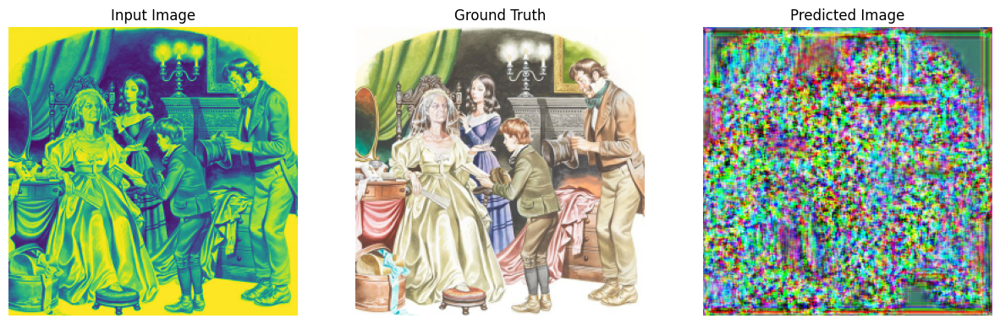

(4, 256, 256, 1)


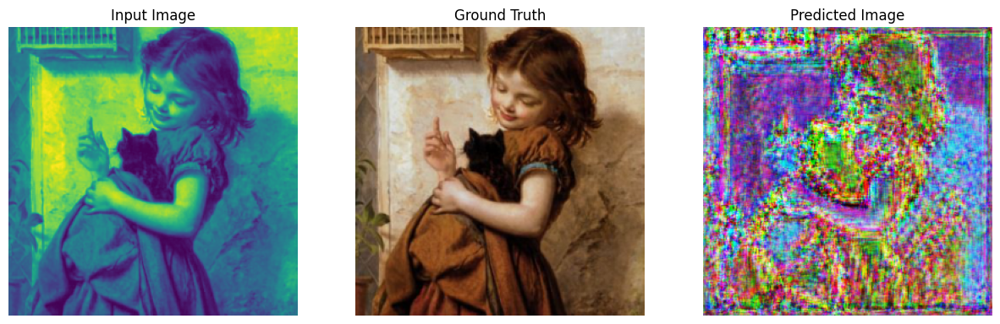

(4, 256, 256, 1)


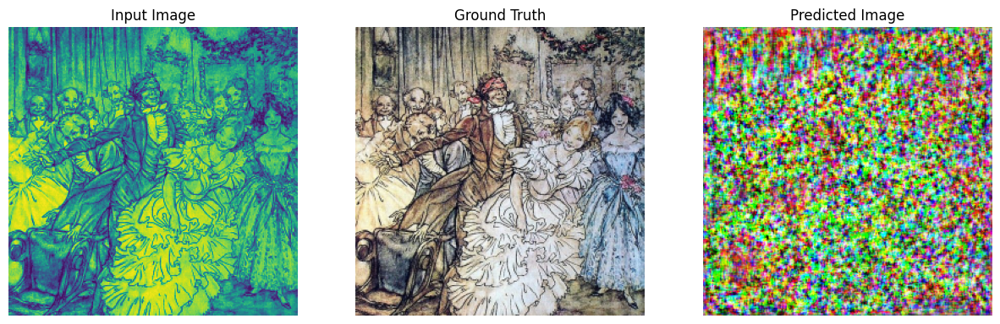

(4, 256, 256, 1)


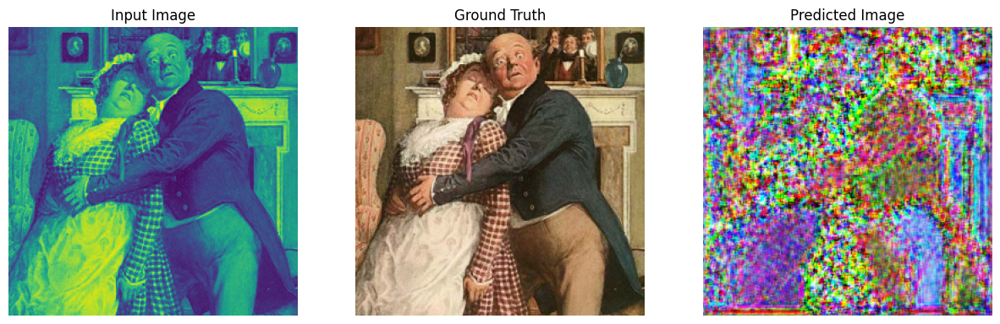

(4, 256, 256, 1)


In [41]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in val_dataset.take(4):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

## **Train My Model**

In [ ]:
hist = fit(train_dataset, epochs = 20)

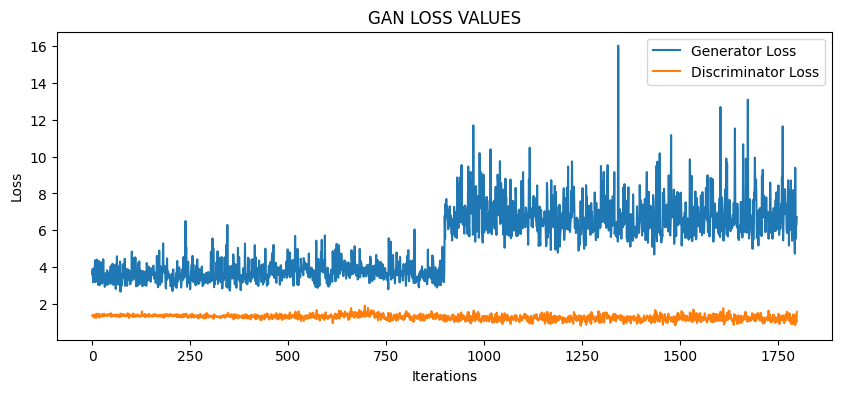

In [51]:
plt.figure(figsize=(10,4))
plt.plot(gen_loss, label="Generator Loss")
plt.plot(disc_loss, label="Discriminator Loss")
plt.title("GAN LOSS VALUES")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

(256, 256, 1)
(256, 256, 1)
(256, 256, 1)


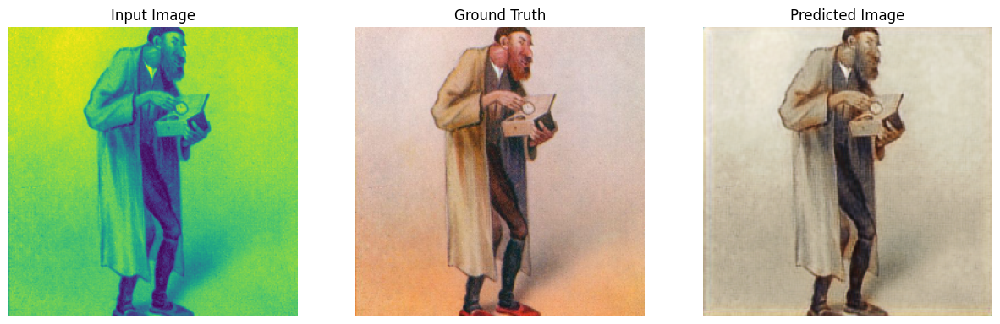

(4, 256, 256, 1)
(256, 256, 1)
(256, 256, 1)
(256, 256, 1)


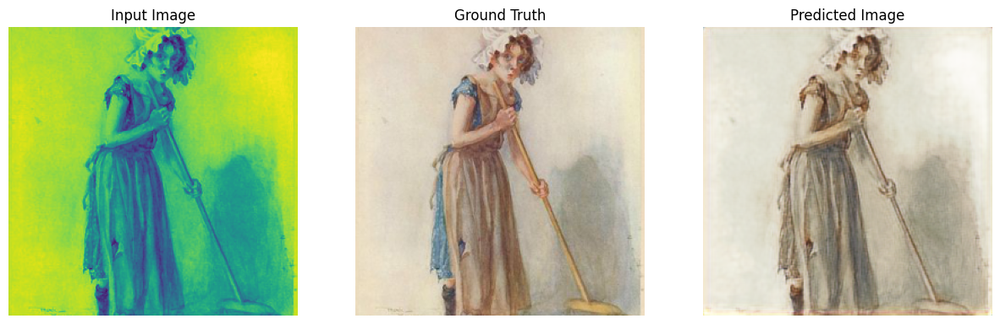

(4, 256, 256, 1)
(256, 256, 1)
(256, 256, 1)
(256, 256, 1)


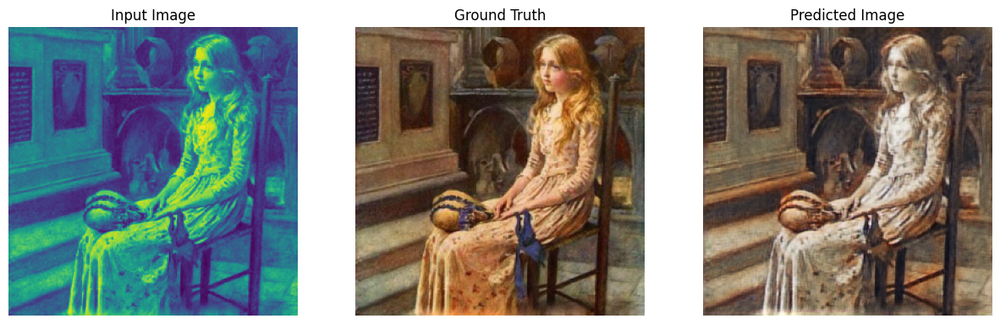

(4, 256, 256, 1)
(256, 256, 1)
(256, 256, 1)
(256, 256, 1)


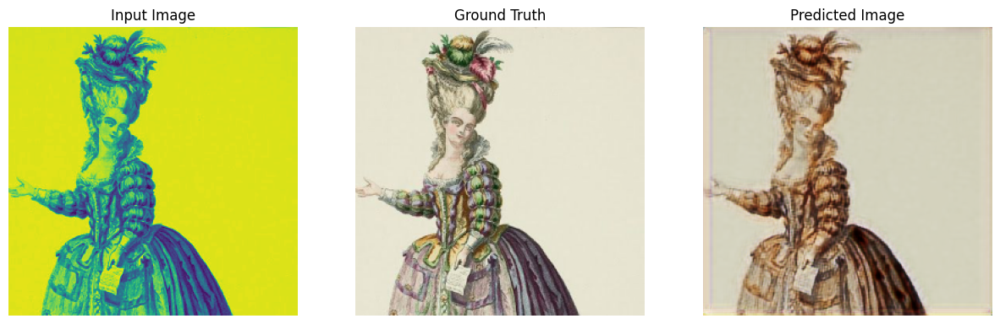

(4, 256, 256, 1)
(256, 256, 1)
(256, 256, 1)
(256, 256, 1)


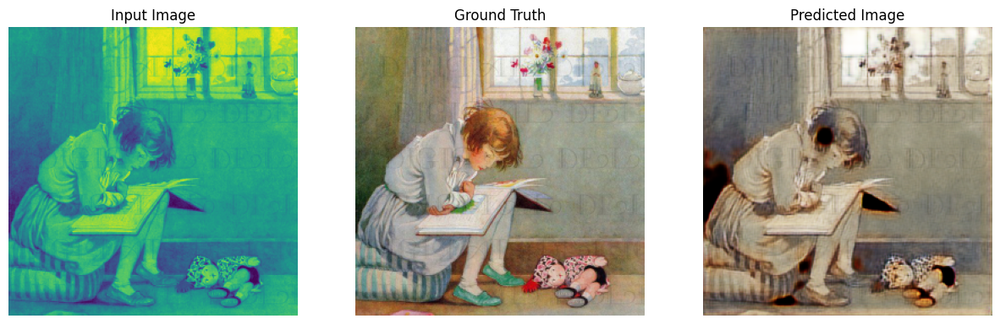

(4, 256, 256, 1)


In [52]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    print(test_input[0].shape)
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in val_dataset.take(5):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)